# Dataset analysis description

### epi_r.csv is a dataset which contains 20052 rows and 680 columns. In order for us to be able to run any sort of valid regression model, we selected the first 6 columns first (title, rating, calories, protein, fat, sodium). We chose to do this step because columns 3-6 contain valid numeric values. Unlike the first columns the other ones only contain 1.0 or 0 to show whether an ingredient is used in the recipe or not or if the recipe can be found in that city or not. We used the first 2 columns (title and rating) just to see what kind of food it is.

### After the first filtering step, we noticed that the remaining columns had NaN values on some rows, so we decided to further filter the dataset. Out of 20052 rows, we were left with only 15864.

### After getting rid of the Zeros in the dataset, we further analyzed it with pandas_profiling.ProfileReport to see the correlation between the columns.

### We ran a few Linear Regression models on the current dataset, but we wanted to improve the current r2 scores. After further analysis we found that the current dataset wasn't clean enough. We discovered quite a few outliers which we later on filtered out.

### We continued our Linear Regression models test, only this time we used the cleaned dataset. We noticed some improvements in the r2 score with some models.

### It was then the time to check our analysis paid off. We created generalized functions for Linear Regression, Polynomial Regression, Decision Tree and Random Forest models and then we tested them. Seeing that they worked well on the tests, we then ran our final tests which we then categorized in a table.

### We then reached a conclusion: the cleaned dataset performed a lot better than the uncleaned one. The only reason this happened is because we eliminated the outliers.

In [1]:
import pandas as pd

data = pd.read_csv("epi_r.csv")
data.head()

,title,rating,calories,protein,fat,sodium,#cakeweek,#wasteless,22-minute meals,3-ingredient recipes,...,yellow squash,yogurt,yonkers,yuca,zucchini,cookbooks,leftovers,snack,snack week,turkey
0,"Lentil, Apple, and Turkey Wrap",2.500,426.0,30.0,7.0,559.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
1,Boudin Blanc Terrine with Red Onion Confit,4.375,403.0,18.0,23.0,1439.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,Potato and Fennel Soup Hodge,3.750,165.0,6.0,7.0,165.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,Mahi-Mahi in Tomato Olive Sauce,5.000,NaN,NaN,NaN,NaN,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,Spinach Noodle Casserole,3.125,547.0,20.0,32.0,452.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [2]:
data.shape

(20052, 680)

In [3]:
data.describe().T

,count,mean,std,min,25%,50%,75%,max
rating,20052.0,3.714467,1.340829,0.0,3.75,4.375,4.375,5.0
calories,15935.0,6322.958017,359046.041242,0.0,198.00,331.000,586.000,30111218.0
protein,15890.0,100.160793,3840.318527,0.0,3.00,8.000,27.000,236489.0
fat,15869.0,346.877497,20456.106859,0.0,7.00,17.000,33.000,1722763.0
sodium,15933.0,6225.974895,333318.188891,0.0,80.00,294.000,711.000,27675110.0
...,...,...,...,...,...,...,...,...
cookbooks,20052.0,0.000150,0.012231,0.0,0.00,0.000,0.000,1.0
leftovers,20052.0,0.000349,0.018681,0.0,0.00,0.000,0.000,1.0
snack,20052.0,0.001396,0.037343,0.0,0.00,0.000,0.000,1.0
snack week,20052.0,0.000948,0.030768,0.0,0.00,0.000,0.000,1.0


In [4]:
data.columns

Index(['title', 'rating', 'calories', 'protein', 'fat', 'sodium', '#cakeweek',
       '#wasteless', '22-minute meals', '3-ingredient recipes',
       ...
       'yellow squash', 'yogurt', 'yonkers', 'yuca', 'zucchini', 'cookbooks',
       'leftovers', 'snack', 'snack week', 'turkey'],
      dtype='object', length=680)

In [5]:
lista_coloane = list(data.columns)

In [6]:
lista_coloane

['title',
 'rating',
 'calories',
 'protein',
 'fat',
 'sodium',
 '#cakeweek',
 '#wasteless',
 '22-minute meals',
 '3-ingredient recipes',
 '30 days of groceries',
 'advance prep required',
 'alabama',
 'alaska',
 'alcoholic',
 'almond',
 'amaretto',
 'anchovy',
 'anise',
 'anniversary',
 'anthony bourdain',
 'aperitif',
 'appetizer',
 'apple',
 'apple juice',
 'apricot',
 'arizona',
 'artichoke',
 'arugula',
 'asian pear',
 'asparagus',
 'aspen',
 'atlanta',
 'australia',
 'avocado',
 'back to school',
 'backyard bbq',
 'bacon',
 'bake',
 'banana',
 'barley',
 'basil',
 'bass',
 'bastille day',
 'bean',
 'beef',
 'beef rib',
 'beef shank',
 'beef tenderloin',
 'beer',
 'beet',
 'bell pepper',
 'berry',
 'beverly hills',
 'birthday',
 'biscuit',
 'bitters',
 'blackberry',
 'blender',
 'blue cheese',
 'blueberry',
 'boil',
 'bok choy',
 'bon appétit',
 'bon app��tit',
 'boston',
 'bourbon',
 'braise',
 'bran',
 'brandy',
 'bread',
 'breadcrumbs',
 'breakfast',
 'brie',
 'brine',
 'brisk

#### Checked to see what the city columns contain

In [7]:
data.washington.sum()

26.0

In [8]:
data.washington.value_counts()

0.0    20026
1.0       26
Name: washington, dtype: int64

#### Filtered useful columns

In [9]:
lista_coloane_utile = ['title','rating', 'calories', 'protein', 'fat', 'sodium']
data2 = data[lista_coloane_utile]

In [10]:
data2

,title,rating,calories,protein,fat,sodium
0,"Lentil, Apple, and Turkey Wrap",2.500,426.0,30.0,7.0,559.0
1,Boudin Blanc Terrine with Red Onion Confit,4.375,403.0,18.0,23.0,1439.0
2,Potato and Fennel Soup Hodge,3.750,165.0,6.0,7.0,165.0
3,Mahi-Mahi in Tomato Olive Sauce,5.000,NaN,NaN,NaN,NaN
4,Spinach Noodle Casserole,3.125,547.0,20.0,32.0,452.0
...,...,...,...,...,...,...
20047,Parmesan Puffs,3.125,28.0,2.0,2.0,64.0
20048,Artichoke and Parmesan Risotto,4.375,671.0,22.0,28.0,583.0
20049,Turkey Cream Puff Pie,4.375,563.0,31.0,38.0,652.0
20050,Snapper on Angel Hair with Citrus Cream,4.375,631.0,45.0,24.0,517.0


In [11]:
data2.describe()

,rating,calories,protein,fat,sodium
count,20052.000000,1.593500e+04,15890.000000,1.586900e+04,1.593300e+04
mean,3.714467,6.322958e+03,100.160793,3.468775e+02,6.225975e+03
std,1.340829,3.590460e+05,3840.318527,2.045611e+04,3.333182e+05
min,0.000000,0.000000e+00,0.000000,0.000000e+00,0.000000e+00
25%,3.750000,1.980000e+02,3.000000,7.000000e+00,8.000000e+01
50%,4.375000,3.310000e+02,8.000000,1.700000e+01,2.940000e+02
75%,4.375000,5.860000e+02,27.000000,3.300000e+01,7.110000e+02
max,5.000000,3.011122e+07,236489.000000,1.722763e+06,2.767511e+07


#### Checked for invalid data

In [12]:
data2.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 20052 entries, 0 to 20051
Data columns (total 6 columns):
 #   Column    Non-Null Count  Dtype  
---  ------    --------------  -----  
 0   title     20052 non-null  object 
 1   rating    20052 non-null  float64
 2   calories  15935 non-null  float64
 3   protein   15890 non-null  float64
 4   fat       15869 non-null  float64
 5   sodium    15933 non-null  float64
dtypes: float64(5), object(1)
memory usage: 940.1+ KB


In [13]:
data2[data2['calories'].isna()].protein.sum()

0.0

In [14]:
data2[data2['calories'].isna()].fat.sum()

0.0

In [15]:
data2[data2['calories'].isna()].sodium.sum()

0.0

#### Filtered invalid data

In [16]:
data3 = data2[~data2['calories'].isna()]
data3

,title,rating,calories,protein,fat,sodium
0,"Lentil, Apple, and Turkey Wrap",2.500,426.0,30.0,7.0,559.0
1,Boudin Blanc Terrine with Red Onion Confit,4.375,403.0,18.0,23.0,1439.0
2,Potato and Fennel Soup Hodge,3.750,165.0,6.0,7.0,165.0
4,Spinach Noodle Casserole,3.125,547.0,20.0,32.0,452.0
5,The Best Blts,4.375,948.0,19.0,79.0,1042.0
...,...,...,...,...,...,...
20047,Parmesan Puffs,3.125,28.0,2.0,2.0,64.0
20048,Artichoke and Parmesan Risotto,4.375,671.0,22.0,28.0,583.0
20049,Turkey Cream Puff Pie,4.375,563.0,31.0,38.0,652.0
20050,Snapper on Angel Hair with Citrus Cream,4.375,631.0,45.0,24.0,517.0


In [17]:
data3.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 15935 entries, 0 to 20051
Data columns (total 6 columns):
 #   Column    Non-Null Count  Dtype  
---  ------    --------------  -----  
 0   title     15935 non-null  object 
 1   rating    15935 non-null  float64
 2   calories  15935 non-null  float64
 3   protein   15890 non-null  float64
 4   fat       15869 non-null  float64
 5   sodium    15933 non-null  float64
dtypes: float64(5), object(1)
memory usage: 871.4+ KB


#### Filtered even further

In [18]:
data4 = data3.dropna()
data4.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 15864 entries, 0 to 20051
Data columns (total 6 columns):
 #   Column    Non-Null Count  Dtype  
---  ------    --------------  -----  
 0   title     15864 non-null  object 
 1   rating    15864 non-null  float64
 2   calories  15864 non-null  float64
 3   protein   15864 non-null  float64
 4   fat       15864 non-null  float64
 5   sodium    15864 non-null  float64
dtypes: float64(5), object(1)
memory usage: 867.6+ KB


In [19]:
data4.tail()

,title,rating,calories,protein,fat,sodium
20047,Parmesan Puffs,3.125,28.0,2.0,2.0,64.0
20048,Artichoke and Parmesan Risotto,4.375,671.0,22.0,28.0,583.0
20049,Turkey Cream Puff Pie,4.375,563.0,31.0,38.0,652.0
20050,Snapper on Angel Hair with Citrus Cream,4.375,631.0,45.0,24.0,517.0
20051,Baked Ham with Marmalade-Horseradish Glaze,4.375,560.0,73.0,10.0,3698.0


In [20]:
data4.describe()

,rating,calories,protein,fat,sodium
count,15864.000000,1.586400e+04,15864.000000,1.586400e+04,1.586400e+04
mean,3.760952,6.350683e+03,100.324571,3.469868e+02,6.252742e+03
std,1.285518,3.598484e+05,3843.462312,2.045933e+04,3.340421e+05
min,0.000000,0.000000e+00,0.000000,0.000000e+00,0.000000e+00
25%,3.750000,1.990000e+02,3.000000,7.000000e+00,8.200000e+01
50%,4.375000,3.330000e+02,8.000000,1.700000e+01,2.960000e+02
75%,4.375000,5.872500e+02,27.000000,3.300000e+01,7.130000e+02
max,5.000000,3.011122e+07,236489.000000,1.722763e+06,2.767511e+07


#### Analysis of the dataset using pandas_profiling.ProfileReport

In [21]:
from pandas_profiling import ProfileReport

profile = ProfileReport(data4, title="Analiza Datelor despre Mancare")

profile

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

#### Recreated the correlation plot without the index

([<matplotlib.axis.YTick at 0x2394fd1a6b0>,
 [Text(0, 0, 'rating'),
  Text(0, 1, 'calories'),
  Text(0, 2, 'protein'),
  Text(0, 3, 'fat'),
  Text(0, 4, 'sodium')])

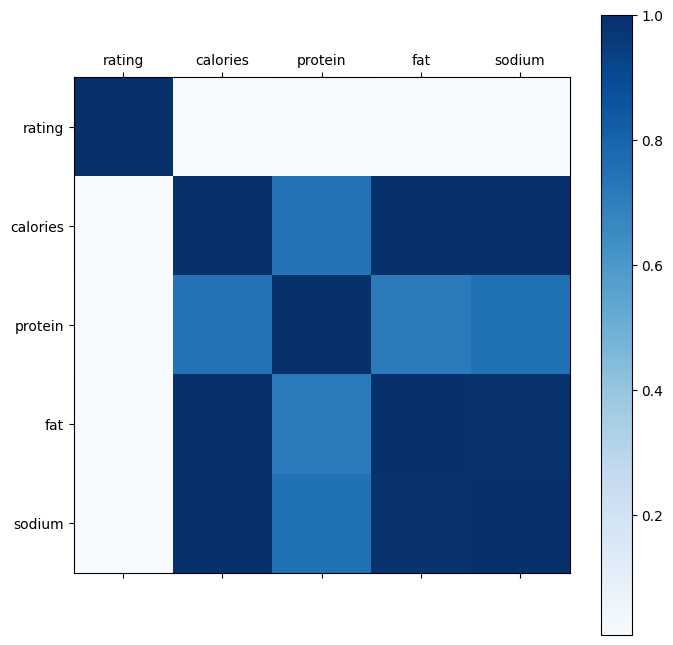

In [22]:
data5 = data4.select_dtypes(include=['int64', 'float64'])

import matplotlib.pyplot as plt
plt.figure(figsize=(8,8))
plt.matshow(data5.corr(), cmap=plt.cm.Blues, fignum=1)
plt.colorbar()
tick_marks = [i for i in range(len(data5.columns))]
plt.xticks(tick_marks, data5.columns)
plt.yticks(tick_marks, data5.columns)

#### Numeric correlation values for a better understanding

In [23]:
data5.corr()

,rating,calories,protein,fat,sodium
rating,1.000000,0.007855,0.013971,0.007235,0.008146
calories,0.007855,1.000000,0.742816,0.996538,0.996392
protein,0.013971,0.742816,1.000000,0.712194,0.749287
fat,0.007235,0.996538,0.712194,1.000000,0.986476
sodium,0.008146,0.996392,0.749287,0.986476,1.000000


#### Initial Linear Regression to predict the fat based on calories

In [24]:
X = data4.calories
y = data4.fat

import numpy as np
X = np.array(X).reshape(-1, 1)
y = np.array(y).reshape(-1, 1)

X.shape, y.shape

((15864, 1), (15864, 1))

In [25]:
from sklearn.model_selection import train_test_split, cross_val_score, cross_val_predict
X_train,X_test, y_train, y_test = train_test_split(X, y)

from sklearn.linear_model import LinearRegression
model = LinearRegression()

model.fit(X_train, y_train)
y_predict = model.predict(X_test)

from sklearn.metrics import r2_score
r2_score(y_predict, y_test)

0.9265730240388852

#### Second Linear Regression to predict the fat based on calories, protein and sodium amount

In [26]:
X_train,X_test, y_train, y_test = train_test_split(X, y, test_size = 0.2, random_state = 42)

from sklearn.linear_model import LinearRegression
from sklearn import linear_model



X = data4[['calories', 'protein', 'sodium']]
y = data4.fat

regr = linear_model.LinearRegression()
regr.fit(X, y)


LinearRegression()

In [27]:
mlin_df = LinearRegression()
mlin_df = mlin_df.fit(X_train, y_train)
mlin_df.intercept_
mlin_df.coef_

array([[0.0566587]])

In [28]:
from sklearn.metrics import mean_squared_error

y_pred = mlin_df.predict(X_test)                                      
rmse = np.sqrt(mean_squared_error(y_train, mlin_df.predict(X_train)))

print("RMSE Score for Test set: " +"{:.2}".format(rmse))
print("R2 Score for Test set: " +"{:.3}".format(r2_score(y_test, y_pred)));

RMSE Score for Test set: 1.9e+03
R2 Score for Test set: 0.745


In [29]:
X = data4.sodium
y = data4.calories

import numpy as np
X = np.array(X).reshape(-1, 1)
y = np.array(y).reshape(-1, 1)

X.shape, y.shape

((15864, 1), (15864, 1))

In [30]:
from sklearn.model_selection import train_test_split, cross_val_score, cross_val_predict
X_train,X_test, y_train, y_test = train_test_split(X, y, test_size = 0.2, random_state = 42)

from sklearn.linear_model import LinearRegression
model = LinearRegression()

model.fit(X_train, y_train)
y_predict = model.predict(X_test)

from sklearn.metrics import r2_score
r2_score(y_predict, y_test)

0.0289825390311107

In [31]:
#calories = f(protein)

X = data4.protein
y = data4.calories

import numpy as np
X = np.array(X).reshape(-1, 1)
y = np.array(y).reshape(-1, 1)

X_train,X_test, y_train, y_test = train_test_split(X, y, test_size = 0.2, random_state = 20)
model = LinearRegression()
model.fit(X_train, y_train)
y_predict = model.predict(X_test)

r2_score(y_predict, y_test)

0.9681057773168076

In [32]:
#calories = f(fat, protein, sodium)

X_train,X_test, y_train, y_test = train_test_split(X, y, test_size = 0.2, random_state = 20)

from sklearn.linear_model import LinearRegression
from sklearn import linear_model
from sklearn.metrics import mean_squared_error


X = data4[['fat', 'protein', 'sodium']]
y = data4.calories

regr = linear_model.LinearRegression()
regr.fit(X, y)

mlin_df = LinearRegression()
mlin_df = mlin_df.fit(X_train, y_train)
mlin_df.intercept_
mlin_df.coef_

y_pred = mlin_df.predict(X_train)

rmse = np.sqrt(mean_squared_error(y_train, mlin_df.predict(X_train)))
print("RMSE Score for Test set: " +"{:.2}".format(rmse))
print("R2 Score for Test set: " +"{:.3}".format(r2_score(y_train, y_pred)));

RMSE Score for Test set: 2.7e+05
R2 Score for Test set: 0.55


#### Outliers were found

<AxesSubplot:xlabel='protein', ylabel='calories'>

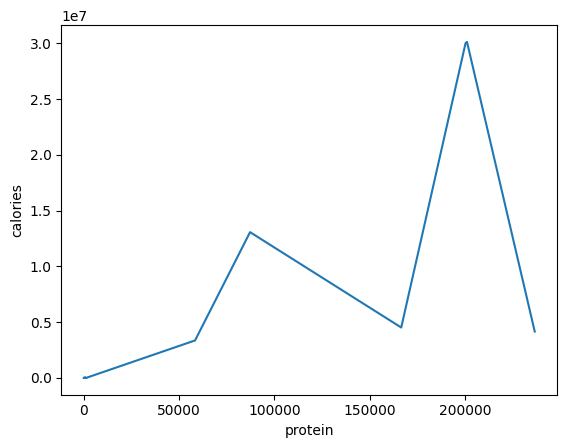

In [33]:
import seaborn as sns

sns.lineplot(data=data4, x='protein', y='calories')

In [34]:
X.describe()

,fat,protein,sodium
count,1.586400e+04,15864.000000,1.586400e+04
mean,3.469868e+02,100.324571,6.252742e+03
std,2.045933e+04,3843.462312,3.340421e+05
min,0.000000e+00,0.000000,0.000000e+00
25%,7.000000e+00,3.000000,8.200000e+01
50%,1.700000e+01,8.000000,2.960000e+02
75%,3.300000e+01,27.000000,7.130000e+02
max,1.722763e+06,236489.000000,2.767511e+07


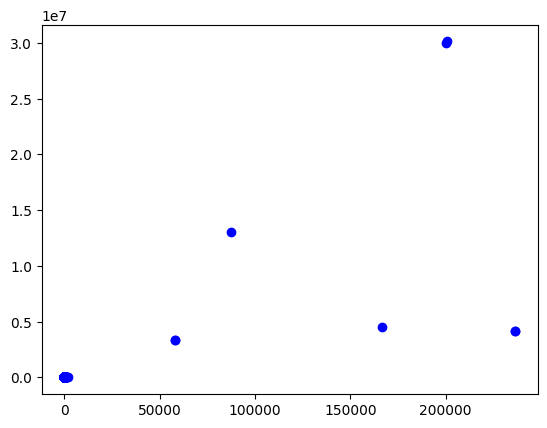

In [35]:
import matplotlib.pyplot as plt

X = data4.protein
y = data4.calories
plt.scatter(X,y, c='blue')

#### In the graph above, we can notice a cluster in the bottom left part, with some very high outliers to follow. Below, we can notice some outliers

In [36]:
lista_valori = list(data4.calories.sort_values(ascending=False))
lista_valori
data4[data4['protein']==236489.0]

,title,rating,calories,protein,fat,sodium
1304,"Rice Pilaf with Lamb, Carrots, and Raisins",5.0,4157357.0,236489.0,221495.0,3134853.0
9731,"Rice Pilaf with Lamb, Carrots, and Raisins",5.0,4157357.0,236489.0,221495.0,3134853.0


#### Filtered the outliers

In [37]:
data4[data4['calories'] < 2000][data4['sodium'] < 1000][data4['protein'] < 200].describe()

C:\Users\bogda\AppData\Local\Temp\ipykernel_2584\3695788652.py:1: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  data4[data4['calories']<2000][data4['sodium']<1000][data4['protein']<200].describe()


,rating,calories,protein,fat,sodium
count,13172.000000,13172.000000,13172.000000,13172.000000,13172.000000
mean,3.731163,372.138855,13.625418,20.722138,288.373292
std,1.312126,285.707961,18.864215,21.516655,268.471378
min,0.000000,0.000000,0.000000,0.000000,0.000000
25%,3.750000,183.000000,2.000000,6.000000,58.000000
50%,4.375000,293.000000,6.000000,15.000000,205.000000
75%,4.375000,486.000000,16.000000,27.000000,461.000000
max,5.000000,1993.000000,192.000000,194.000000,999.000000


In [38]:
data5 = data4[data4['calories'] < 2000][data4['sodium'] < 1000][data4['protein'] < 200]
data5

C:\Users\bogda\AppData\Local\Temp\ipykernel_2584\1270722888.py:1: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  data5 = data4[data4['calories']<2000][data4['sodium']<1000][data4['protein']<200]


,title,rating,calories,protein,fat,sodium
0,"Lentil, Apple, and Turkey Wrap",2.500,426.0,30.0,7.0,559.0
2,Potato and Fennel Soup Hodge,3.750,165.0,6.0,7.0,165.0
4,Spinach Noodle Casserole,3.125,547.0,20.0,32.0,452.0
10,"Yams Braised with Cream, Rosemary and Nutmeg",3.750,256.0,4.0,5.0,30.0
12,Banana-Chocolate Chip Cake With Peanut Butter ...,4.375,766.0,12.0,48.0,439.0
...,...,...,...,...,...,...
20045,Blueberry Compote,3.750,182.0,1.0,0.0,3.0
20047,Parmesan Puffs,3.125,28.0,2.0,2.0,64.0
20048,Artichoke and Parmesan Risotto,4.375,671.0,22.0,28.0,583.0
20049,Turkey Cream Puff Pie,4.375,563.0,31.0,38.0,652.0


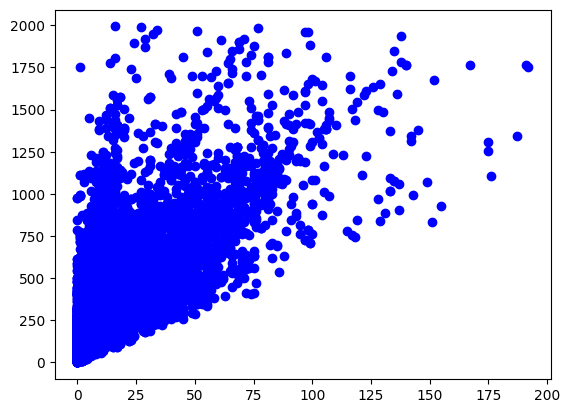

In [39]:
X = data5.protein
y = data5.calories
plt.scatter(X,y, c='blue')

<AxesSubplot:xlabel='protein', ylabel='calories'>

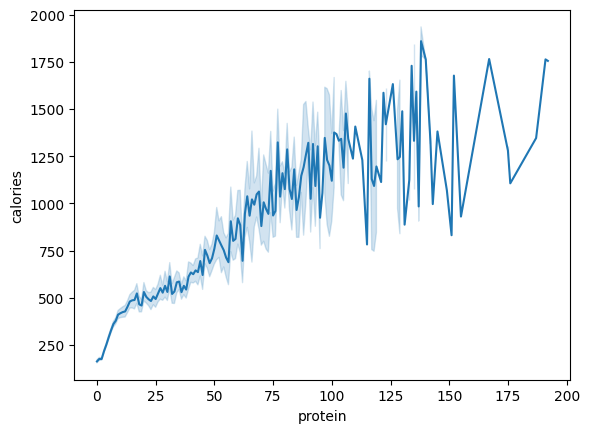

In [40]:
sns.lineplot(data=data5, x='protein', y='calories')

In [41]:
data5.corr()

,rating,calories,protein,fat,sodium
rating,1.000000,0.127599,0.117558,0.133811,0.130800
calories,0.127599,1.000000,0.694646,0.884831,0.400673
protein,0.117558,0.694646,1.000000,0.608721,0.460825
fat,0.133811,0.884831,0.608721,1.000000,0.372015
sodium,0.130800,0.400673,0.460825,0.372015,1.000000


#### Reran Linear Regression models on the cleaned dataset

In [42]:
#calories = f(fat) - with the new dataset 

X = data5.fat
y = data5.calories

import numpy as np
X = np.array(X).reshape(-1, 1)
y = np.array(y).reshape(-1, 1)

X_train,X_test, y_train, y_test = train_test_split(X, y, test_size = 0.2)
model = LinearRegression()
model.fit(X_train, y_train)
y_predict = model.predict(X_test)

r2_score(y_predict, y_test)

0.710530130848732

In [43]:
#calories = f(sodium) - with the new dataset - nu perite modelul sa faca o prezicere pe aceasta combinatie 

X = data5.sodium
y = data5.calories

import numpy as np
X = np.array(X).reshape(-1, 1)
y = np.array(y).reshape(-1, 1)

X_train,X_test, y_train, y_test = train_test_split(X, y, test_size = 0.2, random_state = 42)
model = LinearRegression()
model.fit(X_train, y_train)
y_predict = model.predict(X_test)

r2_score(y_predict, y_test)

-4.015694895247866

In [44]:
#calories = f(fat, protein, sodium) - with the new dataset - R2 score mai bun decat cu o singura variabila => model mai complex si mai bun pentru a prezice

X_train,X_test, y_train, y_test = train_test_split(X, y, test_size = 0.2)

from sklearn.linear_model import LinearRegression
from sklearn import linear_model
from sklearn.metrics import mean_squared_error


X = data5[['fat', 'protein', 'sodium']]
y = data5.calories

regr = linear_model.LinearRegression()
regr.fit(X, y)

mlin_df = LinearRegression()
mlin_df = mlin_df.fit(X_train, y_train)
mlin_df.intercept_
mlin_df.coef_

y_pred = mlin_df.predict(X_train)

rmse = np.sqrt(mean_squared_error(y_train, mlin_df.predict(X_train)))
r2_score_fat_prot_sod_cal_clean = r2_score(y_train, y_pred)

print("RMSE Score for Test set: " +"{:.2}".format(rmse))
print("R2 Score for Test set: " +"{:.3}".format(r2_score_fat_prot_sod_cal_clean));

RMSE Score for Test set: 2.6e+02
R2 Score for Test set: 0.16


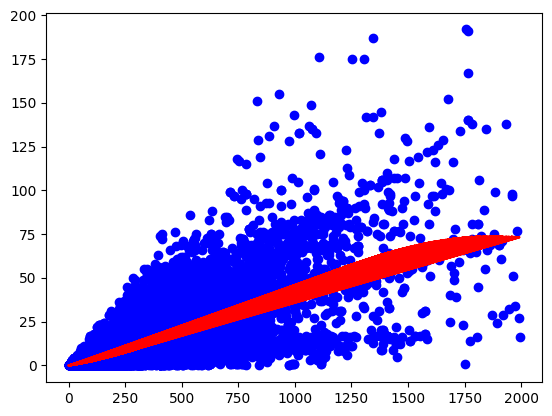

In [45]:
# Polynomial regression - on the new dataset - de calculat si R2 score

from sklearn.preprocessing import PolynomialFeatures as PF

x = data5.iloc[:, 2:3] #calories
y = data5.iloc[:, 3] #protein

poly = PF(degree = 3)
x_poly = poly.fit_transform(x)

poly.fit(x_poly, y)

lin2 = LinearRegression()
lin2.fit(x_poly, data5.protein)

plt.scatter(x, y, color='blue')
plt.plot(x, lin2.predict(poly.fit_transform(x)), color='red')

plt.show()

In [46]:
r2_score(lin2.predict(poly.fit_transform(x)), y)

-0.05142652825436822

In [47]:
from sklearn.tree import DecisionTreeRegressor

dt_reg = DecisionTreeRegressor()          # create  DecisionTreeReg with sklearn
dt_reg.fit(X_train,y_train)

DecisionTreeRegressor()

In [48]:
dt_predict = dt_reg.predict(X_train)
dt_predict

array([435.66666667, 285.38888889, 226.95238095, ..., 385.15384615,
       314.88461538, 212.24137931])

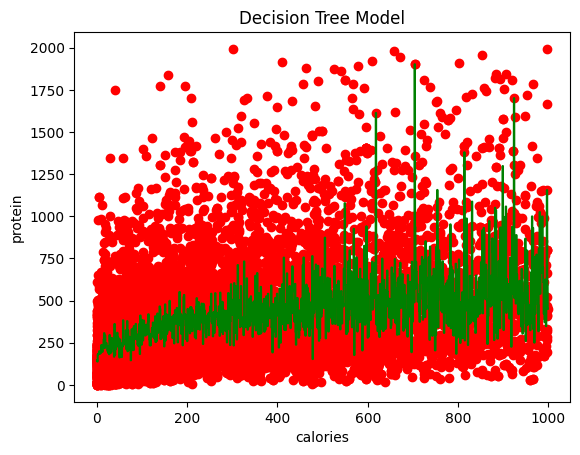

In [49]:
plt.scatter(X_train,y_train, color="red")                           # scatter draw
X_grid = np.arange(min(np.array(X_train)),max(np.array(X_train)), 0.01)  
X_grid = X_grid.reshape((len(X_grid), 1))
plt.plot(X_grid,dt_reg.predict(X_grid),color="g")                 # line draw
plt.xlabel("calories")
plt.ylabel("protein")
plt.title("Decision Tree Model")
plt.show()

#### Test Decision Tree on calories and proteins

In [50]:
from sklearn import tree
from dtreeviz.trees import dtreeviz
regr = tree.DecisionTreeRegressor(max_depth=3)

# X = data5.iloc[:, 2:3][:500] #calories
# y = data5.iloc[:, 3][:500] #protein

x_train, x_test, y_train, y_test = train_test_split(data5.iloc[:, 2:3], data5.iloc[:, 3], random_state = 42, test_size = 0.3)

regr.fit(x_train, y_train)

y_pred = regr.predict(x_test)

viz = dtreeviz(regr,
               x_train,
               y_train,
               target_name='protein', # This name will be displayed at the leaf node
               #feature_names=data5.drop(columns=['title']).columns,
               feature_names=['calories','protein'],
               fontname="Arial",
               title_fontsize=16,
               colors={"title":"purple"}
              )
viz

#viz.view() will give a popup witg graph in pdf

C:\Users\bogda\Envs\curs_python\lib\site-packages\sklearn\base.py:450: UserWarning: X does not have valid feature names, but DecisionTreeRegressor was fitted with feature names
  warnings.warn(


In [51]:
r2_score(y_test, y_pred)

0.4893466432591296

#### Test Decision Tree to predict the calories using all other columns

In [52]:
from sklearn import tree
from dtreeviz.trees import dtreeviz
regr = tree.DecisionTreeRegressor(max_depth=3)


# X = data5.iloc[:, 3:6] # all other columns
# y = data5.iloc[:, 2] # calories

x_train, x_test, y_train, y_test = train_test_split(data5.iloc[:, 3:6], data5.iloc[:, 2], test_size = 0.3, random_state = 42)

regr.fit(x_train, y_train)

y_pred = regr.predict(x_test)

viz = dtreeviz(regr,
               x_train,
               y_train,
               target_name='protein', # This name will be displayed at the leaf node
               #feature_names=data5.drop(columns=['title']).columns,
               feature_names=['calories','protein'],
               fontname="Arial",
               title_fontsize=16,
               colors={"title":"purple"}
              )
viz

C:\Users\bogda\Envs\curs_python\lib\site-packages\sklearn\base.py:450: UserWarning: X does not have valid feature names, but DecisionTreeRegressor was fitted with feature names
  warnings.warn(


In [53]:
r2_score(y_test, y_pred)

0.7689082890868638

### We are approaching the last stages of the dataset processing! First thing we need to do is create generalized functions for Linear Regression, Polynomial Regression, Decision Tree and Random Forest Regression

#### 1) Linear Regression function

In [54]:
def LR(x, y, test_size = 0.3, random_state = 42):
    from sklearn.model_selection import train_test_split, cross_val_score, cross_val_predict
    x_train, x_test, y_train, y_test = train_test_split(x, y, test_size = test_size, random_state = random_state)

    from sklearn.linear_model import LinearRegression
    model = LinearRegression()
    
    model.fit(x_train, y_train)
    y_predict = model.predict(x_test)
    
    from sklearn.metrics import r2_score
    return r2_score(y_test, y_predict)

In [55]:
LR(data5.iloc[:, 3:6], data5.iloc[:, 2])

0.8137030621918124

#### 2) Polynomial Regression

In [56]:
def PR(x, y, test_size = 0.3, random_state = 42):
    from sklearn.preprocessing import PolynomialFeatures as PF
    poly = PF(degree = 3)
    x_poly = poly.fit_transform(x)
    
    from sklearn.model_selection import train_test_split, cross_val_score, cross_val_predict
    x_train, x_test, y_train, y_test = train_test_split(x_poly, y, test_size = test_size, random_state = random_state)
    
    from sklearn.linear_model import LinearRegression
    model = LinearRegression()
    model.fit(x_train, y_train)
    y_predict = model.predict(x_test)
    
    # x_train_copy = x_train.copy()
    # x_train_copy = np.array(x_train_copy).reshape(-1, 1)
    # y_train_copy = y_train.copy()
    # plt.scatter(x_train_copy, y_train_copy, color='blue')
    # plt.plot(x_train_copy, y_train_copy, color='red')
    
    # plt.show()
    
    return r2_score(y_test, y_pred)

In [57]:
PR(data5.iloc[:, 3:6], data5.iloc[:, 2])

0.7689082890868638

#### 3) Decision Tree function

In [58]:
def DT(x, y, test_size = 0.3, random_state = 42, graph = False):
    from sklearn import tree
    from dtreeviz.trees import dtreeviz
    regr = tree.DecisionTreeRegressor(max_depth=3)

    x_train, x_test, y_train, y_test = train_test_split(x, y, test_size = test_size, random_state = random_state)

    regr.fit(x_train, y_train)

    y_pred = regr.predict(x_test)
    
    if graph == True:
        viz = dtreeviz(regr,
               x_train,
               y_train,
               target_name='protein', # This name will be displayed at the leaf node
               #feature_names=data5.drop(columns=['title']).columns,
               feature_names=['calories','protein'],
               fontname="Arial",
               title_fontsize=16,
               colors={"title":"purple"}
              )
        viz
        
    return r2_score(y_test, y_pred)

In [59]:
DT(data5.iloc[:, 3:6], data5.iloc[:, 2])

0.7689082890868638

#### 4) Random Forest Regression

In [60]:
def RF(x, y, random_state = 42, test_size = 0.3):
    x_train, x_test, y_train, y_test = train_test_split(x, y, test_size = test_size, random_state = random_state)
    
    from sklearn.ensemble import RandomForestRegressor
    forest = RandomForestRegressor(n_estimators = 100,
                               min_samples_split=5,
                               max_leaf_nodes=6,
                               criterion = 'squared_error',
                               random_state = 42,
                               n_jobs = -1)
    forest.fit(x_train,y_train)
    forest_train_pred = forest.predict(x_train)
    forest_test_pred = forest.predict(x_test)
    
    return r2_score(y_test, forest_test_pred)

In [61]:
RF(data4.iloc[:, 3:6], data4.iloc[:, 2])

0.7539639108751163

### The last step that needs to be done is creating a table to better emphasize the role which previous outliers had in our regressions. We are going to perform all the regression models on both the uncleaned dataset and the cleaned one. 
#### We are going to first take protein, fat and sodium individually, predict the calories and check the prediction accuracy with the Linear Regression model.
#### We are then going to take protein, fat and sodium together and check the prediction accuracy using the Linear Regression again, then Polynomial Regression, Decision Tree and Random Forest Regression.

In [62]:
LinearRegression1 = []
LinearRegression1.append(LR(data4.iloc[:, 3:4], data4.iloc[:, 2]))
LinearRegression1.append(LR(data5.iloc[:, 3:4], data5.iloc[:, 2]))
LinearRegression1

[-14.428073481917643, 0.480933172606718]

In [63]:
LinearRegression2 = []
LinearRegression2.append(LR(data4.iloc[:, 4:5], data4.iloc[:, 2]))
LinearRegression2.append(LR(data5.iloc[:, 4:5], data5.iloc[:, 2]))
LinearRegression2

[0.4770786511443158, 0.7756343130663862]

In [64]:
LinearRegression3 = []
LinearRegression3.append(LR(data4.iloc[:, 5:6], data4.iloc[:, 2]))
LinearRegression3.append(LR(data5.iloc[:, 5:6], data5.iloc[:, 2]))
LinearRegression3

[-19.035013614661583, 0.15703698200113048]

In [65]:
LinearMultivariableRegression = []
LinearMultivariableRegression.append(LR(data4.iloc[:, 3:6], data4.iloc[:, 2]))
LinearMultivariableRegression.append(LR(data5.iloc[:, 3:6], data5.iloc[:, 2]))
LinearMultivariableRegression

[-3.251126901703433, 0.8137030621918124]

#### Trying to run polynomial regression on the uncleaned dataset, we ran into an error

In [66]:
PolynomialRegression = []
PolynomialRegression.append(np.NaN)
PolynomialRegression.append(PR(data5.iloc[:, 3:6], data5.iloc[:, 2]))
PolynomialRegression

[nan, 0.7689082890868638]

In [67]:
DecisionTree = []
DecisionTree.append(LR(data4.iloc[:, 3:6], data4.iloc[:, 2]))
DecisionTree.append(LR(data5.iloc[:, 3:6], data5.iloc[:, 2]))
DecisionTree

[-3.251126901703433, 0.8137030621918124]

In [68]:
RandomForest = []
RandomForest.append(RF(data4.iloc[:, 3:6], data4.iloc[:, 2]))
RandomForest.append(RF(data5.iloc[:, 3:6], data5.iloc[:, 2]))
RandomForest

[0.7539639108751163, 0.7664854850252368]

In [69]:
table = pd.DataFrame()
data = pd.DataFrame({"LR1": LinearRegression1, "LR2": LinearRegression2, "LR3": LinearRegression3, 
                     "LMR": LinearMultivariableRegression, "Poly": PolynomialRegression, 
                     "DT": DecisionTree, "RF": RandomForest})

table = table.append(data)
table

C:\Users\bogda\AppData\Local\Temp\ipykernel_2584\458605225.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  table = table.append(data)


,LR1,LR2,LR3,LMR,Poly,DT,RF
0,-14.428073,0.477079,-19.035014,-3.251127,NaN,-3.251127,0.753964
1,0.480933,0.775634,0.157037,0.813703,0.768908,0.813703,0.766485


In [70]:
table.index = ['unclean data', 'clean data']
table

,LR1,LR2,LR3,LMR,Poly,DT,RF
unclean data,-14.428073,0.477079,-19.035014,-3.251127,NaN,-3.251127,0.753964
clean data,0.480933,0.775634,0.157037,0.813703,0.768908,0.813703,0.766485


#### From this table, we can notice that the Linear Regression and Decision Tree models either have a low r2 score or are incompatible for the uncleaned dataset, Random Forest Regression model being the only one that can be used to predict the calories based on the other 3 variables
#### We can also notice that the results are very different for the cleaned dataset. (2nd) Linear Regression using the fat amount in order to predict calories being the one with the best accuracy for the single variable model. Linear Multivariable Regression and Decision Tree models are the best models in terms of accuracy, while Random Forest has a slightly lower accuracy than the second Linear Regression.